# 01 - Danish Fungi - Localize Saliency Regions Example

In [1]:
import os

os.chdir('..')

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch

from src.core import data, training, models, metrics
from src.special import saliency
from src.utils import visualization as viz

DATA_DIR = 'data/danish_fungi_dataset/'
TRAIN_SET_DIR = 'train_resized'

MODEL_ARCH = 'efficientnet_b0'
MODEL_NAME = 'baselines_mini/df2020_efficientnet_b0_ce_11-04-2021_19-52-55'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')

Device: cpu


## Load the Data

In [3]:
train_df = pd.read_csv(DATA_DIR + 'DF20M-train_metadata_PROD.csv')
# valid_df = pd.read_csv(DATA_DIR + 'DF20M-public_test_metadata_PROD.csv')

classes = np.unique(train_df['scientificName'])
no_classes = len(classes)
print(f'No classes: {no_classes}')
print(f'Train set length: {len(train_df):,d}')

No classes: 182
Train set length: 32,753


## Create NN and Dataset

In [4]:
# create model
model = models.get_model(MODEL_ARCH, no_classes, pretrained=True)
training.load_model(model, MODEL_NAME, path=DATA_DIR + 'models')
assert np.all([param.requires_grad for param in model.parameters()])

model_config = model.pretrained_config

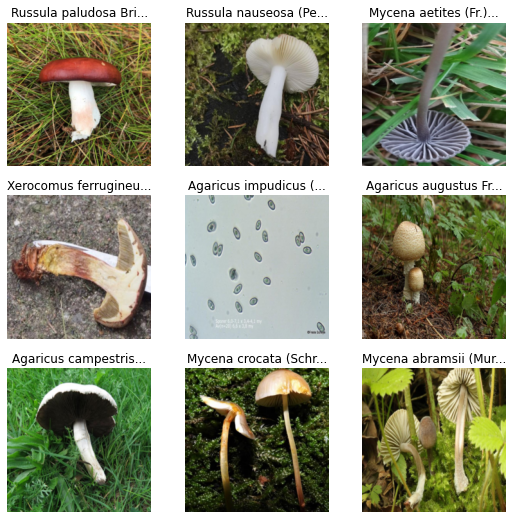

In [5]:
# create transforms
_, tfms = data.get_transforms(
    size=model_config['input_size'], mean=model_config['image_mean'],
    std=model_config['image_std'])

# create dataset
dataset = data.ImageDataset(
    train_df, img_path_col='image_path', label_col='scientificName',
    path=DATA_DIR + TRAIN_SET_DIR, transforms=tfms)

dataset.show_items()

## Create Saliency Map for One Example

In [6]:
# get image
img_idx = 0
img, label = dataset[img_idx]

# create saliency map
saliency_map = saliency.get_saliency_map(model, img, label=label)

# binarize saliency map
saliency_map_bin = saliency.binarize_saliency_map(saliency_map, percentile=95)

# get bounding box covering highest intensities
bbox, saliency_map_cleaned = saliency.get_bounding_box(
    saliency_map, bin_percentile=95, clust_pixel_th=10)

In [14]:
dataset.id2label(label)

'Mycena crocata (Schrad.) P.Kumm.'

### Plot Saliency Map

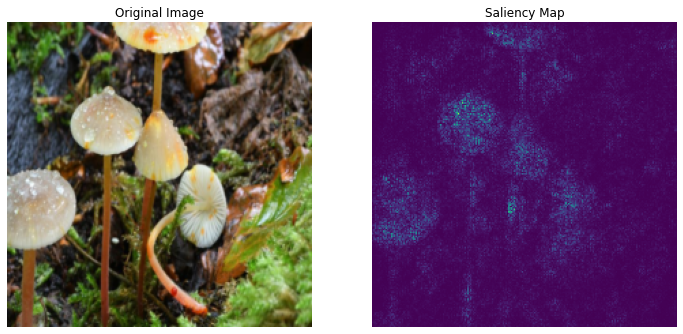

In [7]:
# plot image and saliency map
fig, (ax1, ax2) = viz.create_fig(ncols=2, colsize=6, rowsize=6)
# viz.imshow(img, ax=ax1)
dataset.show_item(img_idx, ax=ax1)
ax1.axis('off')
ax1.set(title='Original Image')
ax2.imshow(saliency_map, cmap='viridis')
ax2.axis('off')
ax2.set(title='Saliency Map')
# fig.tight_layout()
plt.show()

### Plot Binarized Saliency Map

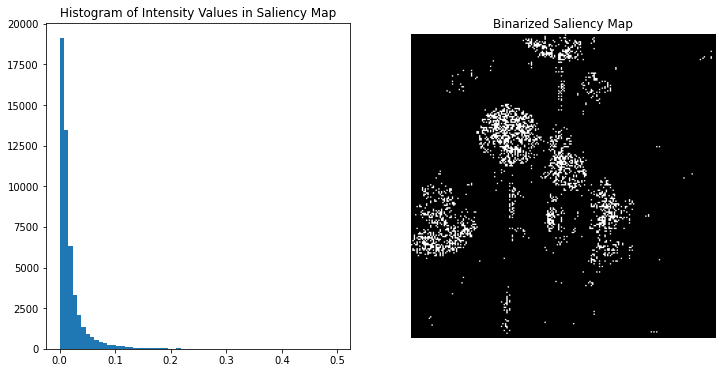

In [8]:
# plot histogram and binarized saliency map
fig, (ax1, ax2) = viz.create_fig(ncols=2, colsize=6, rowsize=6)
ax1.hist(saliency_map.reshape(-1), bins=64)
ax1.set(title='Histogram of Intensity Values in Saliency Map')
ax2.imshow(saliency_map_bin, cmap='gray')
ax2.axis('off')
ax2.set(title='Binarized Saliency Map')
plt.show()

### Plot Cleaned Saliency Map and Found Bounding Box

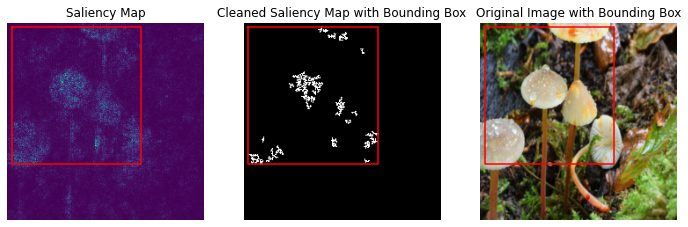

In [9]:
# plot cleaned saliency map with bounding box
fig, (ax1, ax2, ax3) = viz.create_fig(ncols=3, colsize=4, rowsize=4)

viz.imshow(saliency_map, ax=ax1, cmap='viridis', bbox=bbox)
ax1.axis('off')
ax1.set(title='Saliency Map')

viz.imshow(saliency_map_cleaned, ax=ax2, cmap='gray', bbox=bbox)
ax2.axis('off')
ax2.set(title='Cleaned Saliency Map with Bounding Box')

dataset.show_item(img_idx, ax=ax3)
viz.plot_bbox(bbox, ax=ax3)
ax3.axis('off')
ax3.set(title='Original Image with Bounding Box')

plt.show()

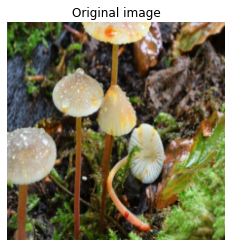

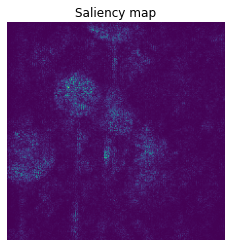

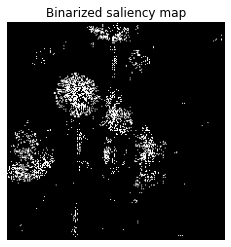

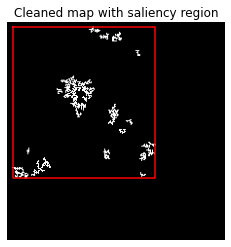

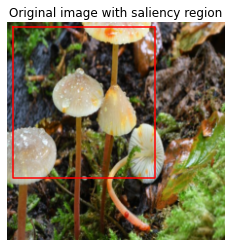

In [11]:
fig, ax = viz.create_fig(colsize=4, rowsize=4)
dataset.show_item(img_idx, ax=ax)
ax.set(title='Original image')
ax.axis('off')
plt.show()
fig.savefig('figures/fungi_saliency/original_image.png', bbox_inches='tight')

fig, ax = viz.create_fig(colsize=4, rowsize=4)
viz.imshow(saliency_map, ax=ax, cmap='viridis')
ax.set(title='Saliency map')
ax.axis('off')
plt.show()
fig.savefig('figures/fungi_saliency/saliency_map.png', bbox_inches='tight')

fig, ax = viz.create_fig(colsize=4, rowsize=4)
viz.imshow(saliency_map_bin, ax=ax, cmap='gray')
ax.set(title='Binarized saliency map')
ax.axis('off')
plt.show()
fig.savefig('figures/fungi_saliency/saliency_map_binarized.png', bbox_inches='tight')

fig, ax = viz.create_fig(colsize=4, rowsize=4)
viz.imshow(saliency_map_cleaned, ax=ax, cmap='gray', bbox=bbox)
ax.set(title='Cleaned map with saliency region')
ax.axis('off')
plt.show()
fig.savefig('figures/fungi_saliency/cleaned_map_with_saliency_box.png', bbox_inches='tight')

fig, ax = viz.create_fig(colsize=4, rowsize=4)
dataset.show_item(img_idx, ax=ax)
viz.plot_bbox(bbox, ax=ax)
ax.set(title='Original image with saliency region')
ax.axis('off')
plt.show()
fig.savefig('figures/fungi_saliency/original_image_with_saliency_box.png', bbox_inches='tight')

## Create Saliency Map for Multiple Examples

2862684394-136762.JPG


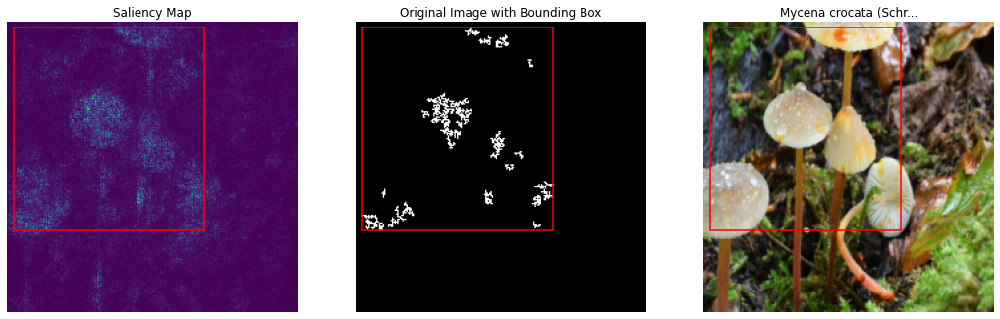

2238502117-320693.JPG


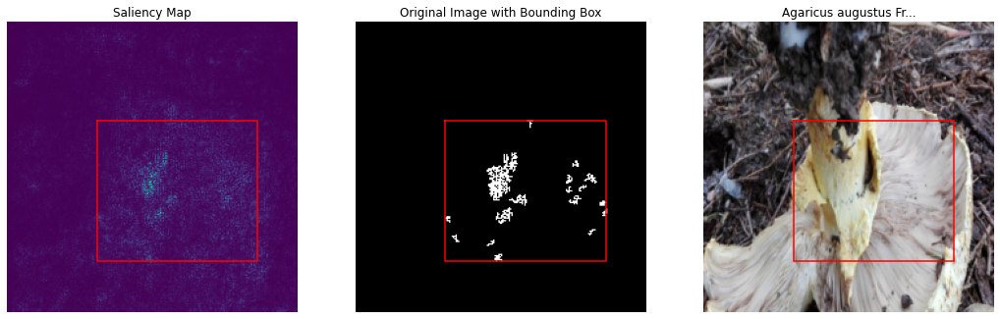

2818074328-59948.JPG


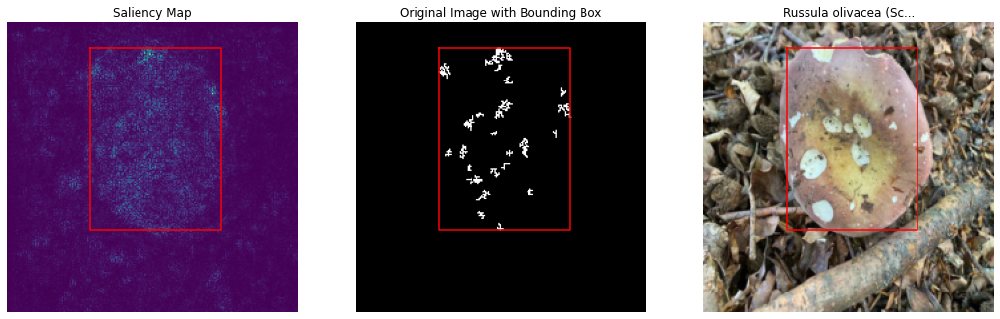

2238560017-331396.JPG


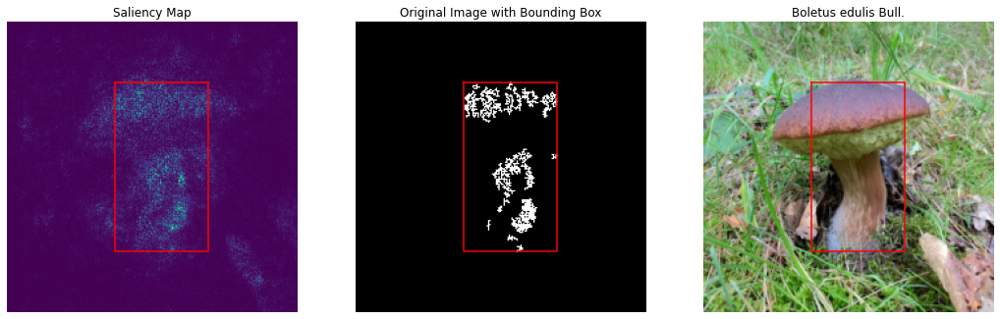

2237970493-5168.JPG


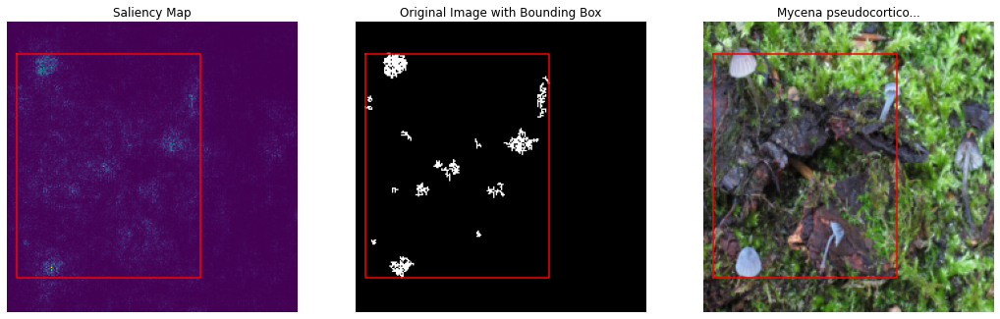

2898621335-216661.JPG


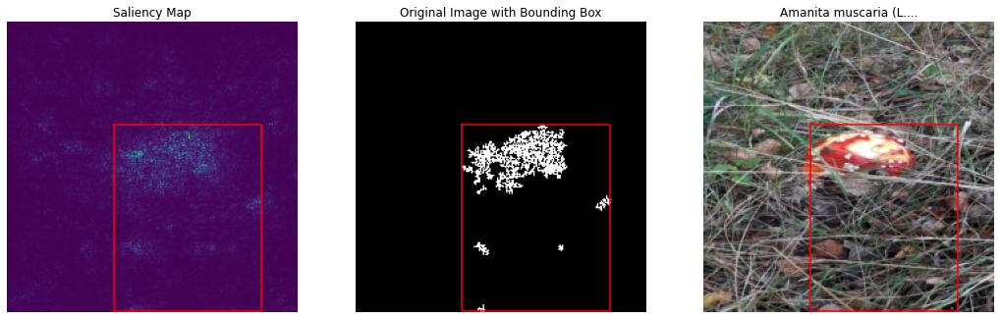

2383043036-265877.JPG


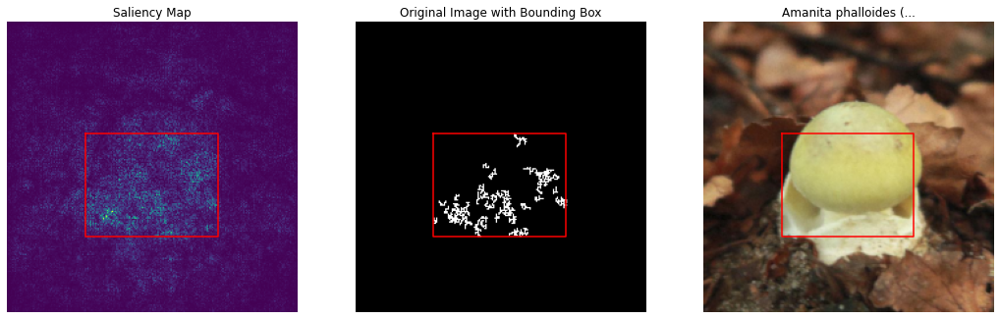

2874312335-214797.JPG


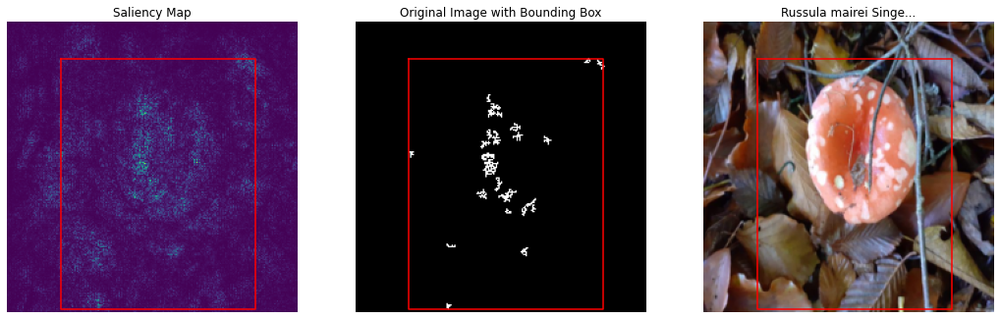

2238161306-230699.JPG


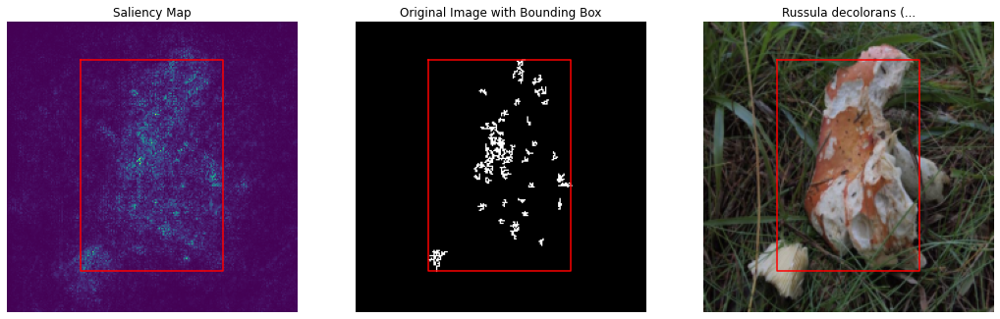

2238482590-168374.JPG


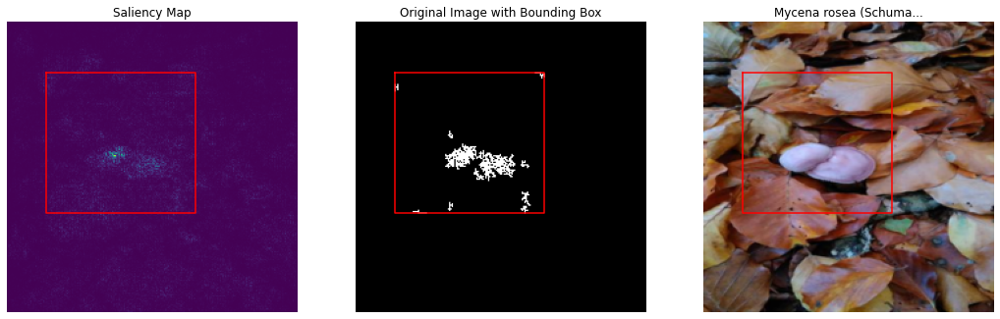

2237917357-300664.JPG


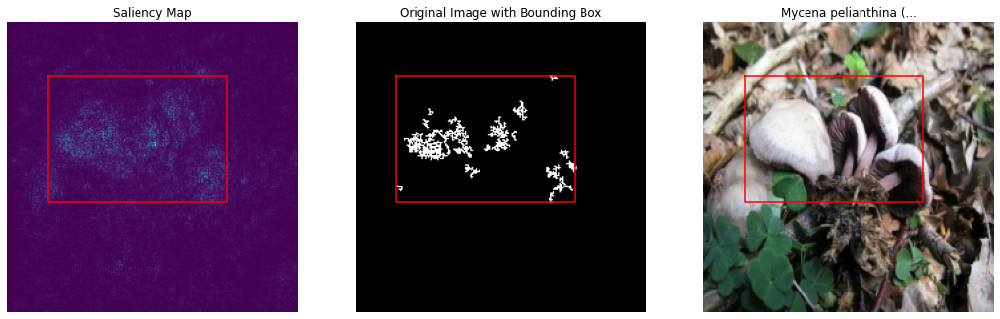

2238582127-335885.JPG


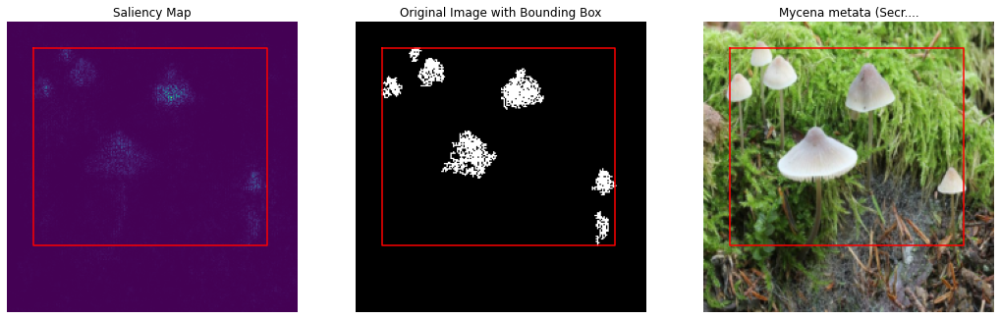

2238498333-22587.JPG


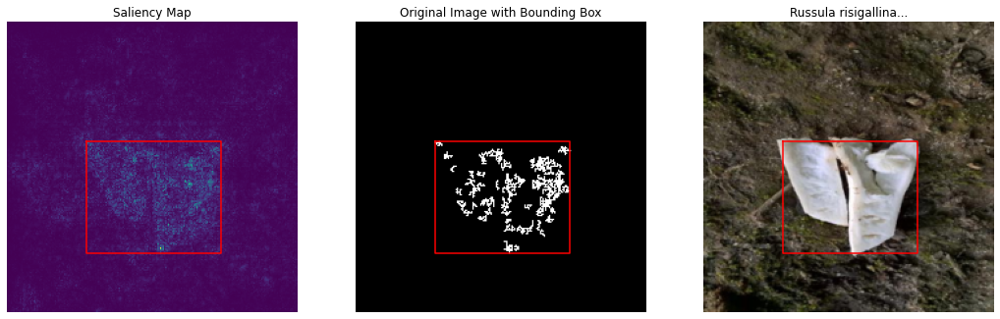

2238579022-335141.JPG


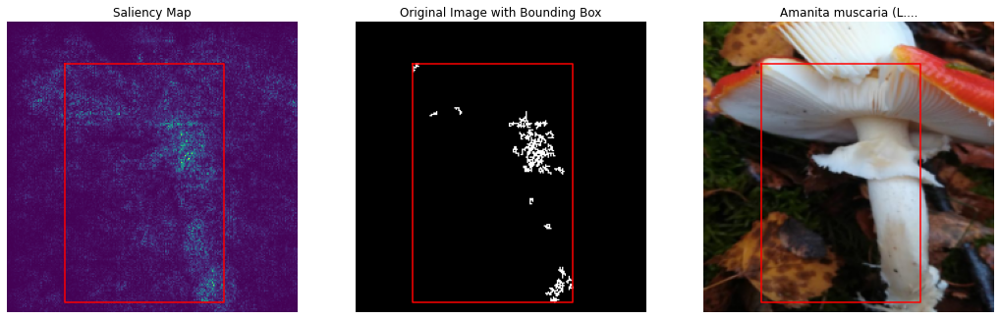

2238147748-7669.JPG


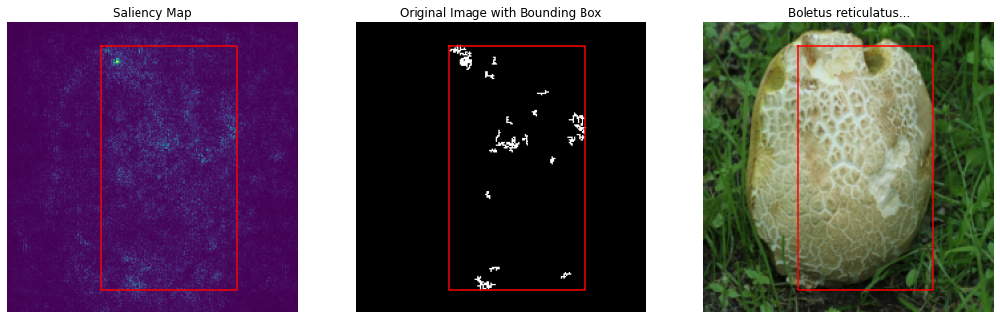

2862687322-360801.JPG


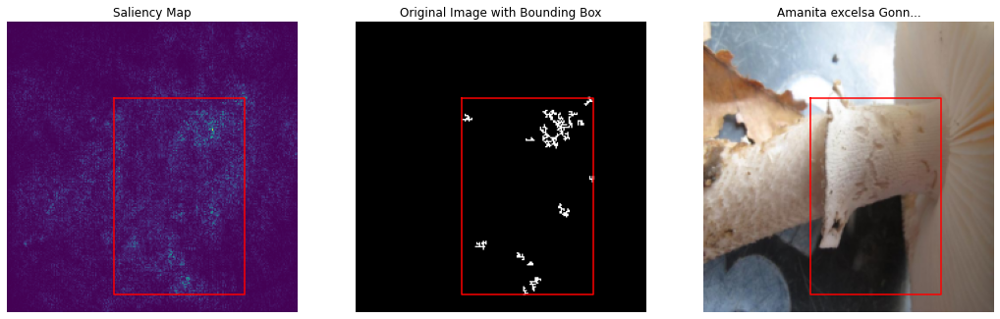

2449441840-198331.JPG


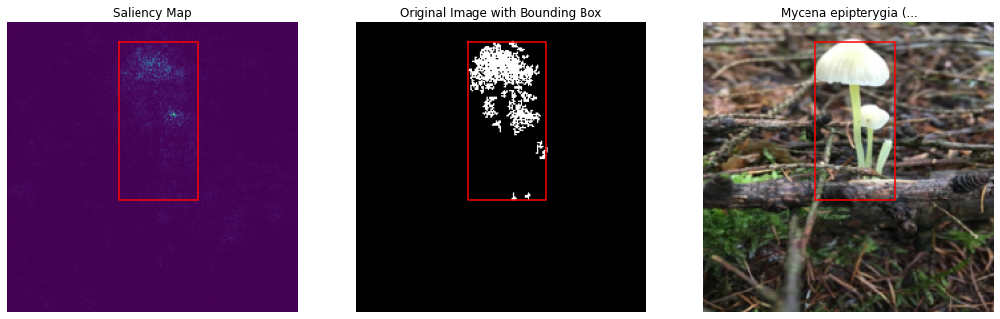

2238513828-25152.JPG


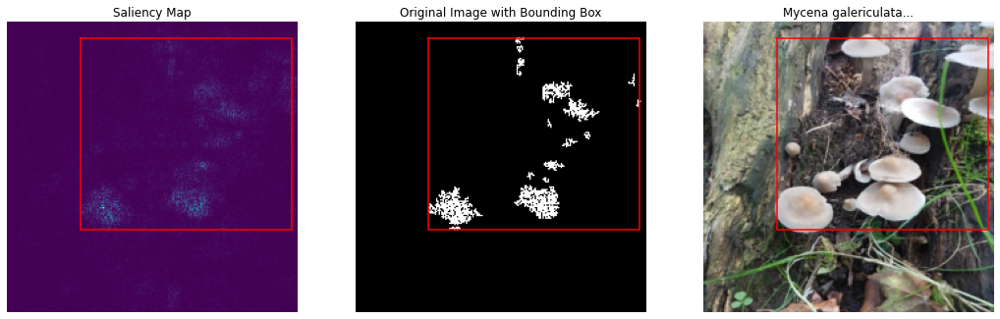

2383042367-340910.JPG


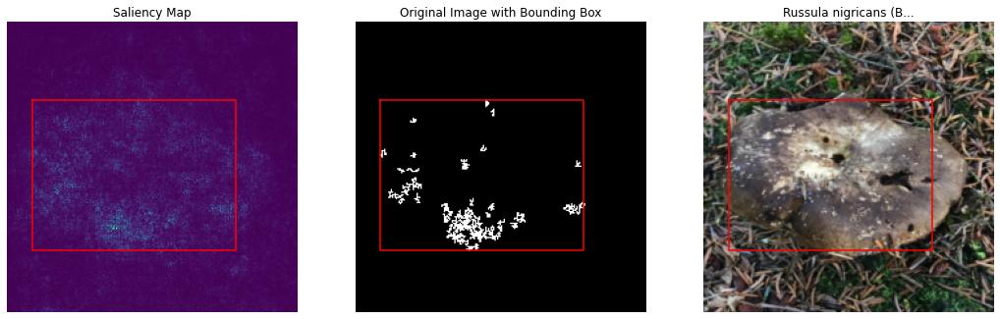

2238577229-111433.JPG


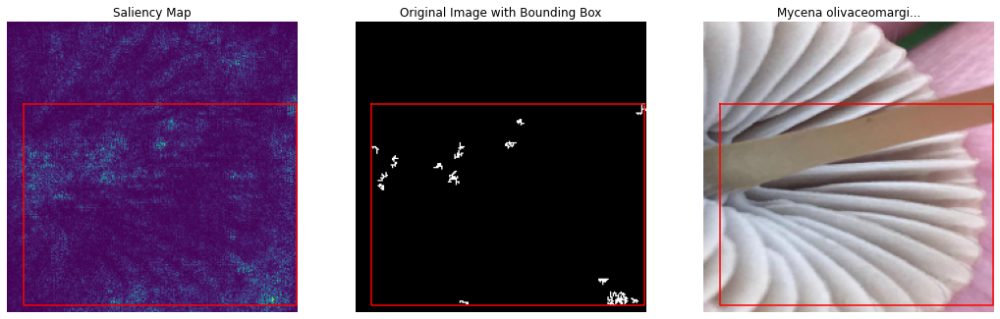

In [10]:
for i in range(20):
    # get image
    img, label = dataset[i]
    print(dataset.df['image_path'].iloc[i])

    # create saliency map
    saliency_map = saliency.get_saliency_map(model, img, label=label)

    # get bounding box covering highest intensities
    bbox, saliency_map_cleaned = saliency.get_bounding_box(
        saliency_map, bin_percentile=95, clust_pixel_th=10)

    # plot results
    fig, (ax1, ax2, ax3) = viz.create_fig(ncols=3, colsize=6, rowsize=6)

    viz.imshow(saliency_map, ax=ax1, cmap='viridis', bbox=bbox)
    ax1.axis('off')
    ax1.set(title='Saliency Map')

    viz.imshow(saliency_map_cleaned, ax=ax2, cmap='gray', bbox=bbox)
    ax2.axis('off')
    ax2.set(title='Cleaned Saliency Map with Bounding Box')

    dataset.show_item(i, ax=ax3)
    viz.plot_bbox(bbox, ax=ax3)
    ax2.axis('off')
    ax2.set(title='Original Image with Bounding Box')

    plt.show()